## Utility setup

In [203]:
!sudo apt update 
!sudo apt upgrade
!sudo apt install imagemagick

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:5 http://archive.ubuntu.com/ubuntu bionic InRelease
Ign:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:11 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:15 http://ppa.launchpad

In [204]:
from pylab import rcParams
rcParams['animation.convert_path'] = r'/usr/bin/convert'

In [205]:
from IPython.display import HTML, display

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))

## Data preprocessing

In [206]:
from sklearn import datasets
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import numpy as np

In [207]:
boston = datasets.load_boston()
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [208]:
df = pd.DataFrame(data = boston.data)
df.columns = boston.feature_names
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [209]:
df['Target'] = boston.target
df = df.rename(columns = {'Target':'Price'})
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [210]:
corr = df.corr()
corr

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


In [211]:
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [212]:
corr['Price'].sort_values(ascending = False)

Price      1.000000
RM         0.695360
ZN         0.360445
B          0.333461
DIS        0.249929
CHAS       0.175260
AGE       -0.376955
RAD       -0.381626
CRIM      -0.388305
NOX       -0.427321
TAX       -0.468536
INDUS     -0.483725
PTRATIO   -0.507787
LSTAT     -0.737663
Name: Price, dtype: float64

Negative correlation is as good as positive. Only with the idea that the values behave in the opposite ways.

In [213]:
corr_values = corr['Price'].abs().sort_values(ascending = False)
corr_values

Price      1.000000
LSTAT      0.737663
RM         0.695360
PTRATIO    0.507787
INDUS      0.483725
TAX        0.468536
NOX        0.427321
CRIM       0.388305
RAD        0.381626
AGE        0.376955
ZN         0.360445
B          0.333461
DIS        0.249929
CHAS       0.175260
Name: Price, dtype: float64

So, as we see the correlation between Price and LSTAT and RM stat is evidently higher than correlation between Other Columns and Price. So we'll cut our dataset to just two X_values - RM and LSTAT and try to find the correct Regression which could help us predict Price based on the data.

In [214]:
from sklearn import preprocessing

x_RM = preprocessing.scale(df['RM'])
x_LSTAT = preprocessing.scale(df['LSTAT'])
y = preprocessing.scale(df['Price'])
np.array([x_RM.T, x_LSTAT.T, y.T])

array([[ 0.41367189,  0.19427445,  1.28271368, ...,  0.98496002,
         0.72567214, -0.36276709],
       [-1.0755623 , -0.49243937, -1.2087274 , ..., -0.98304761,
        -0.86530163, -0.66905833],
       [ 0.15968566, -0.10152429,  1.32424667, ...,  0.14880191,
        -0.0579893 , -1.15724782]])

In [215]:
rcParams['figure.figsize'] = 12,8

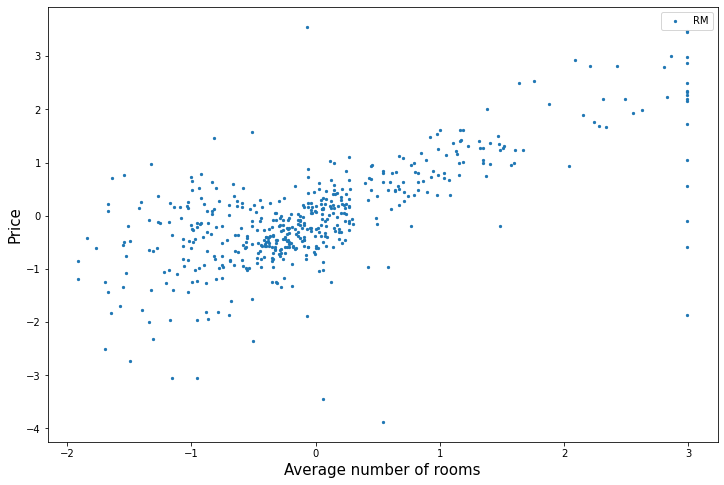

In [216]:
plt.scatter(y, x_RM, s=5, label = 'RM')
plt.legend(fontsize=15)
plt.xlabel('Average number of rooms', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.legend()
plt.show()

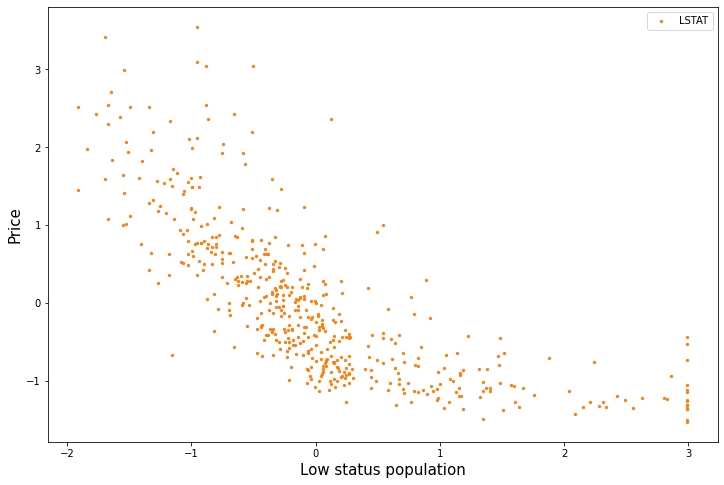

In [217]:
plt.scatter(y, x_LSTAT, s=5, label = 'LSTAT', c=['#ff7f0e'])
plt.legend(fontsize=15)
plt.xlabel('Low status population', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.legend()
plt.show()

## Result visualizer

In [218]:
import io
import base64
from IPython.display import HTML

import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D

In [219]:
def plot_3D(X, y, theta):
    # Create a figure and a 3D Axes
    fig = plt.figure(figsize=(12,10))

    ax = Axes3D(fig)
    ax.set_xlabel('Rooms', fontsize = 15)
    ax.set_ylabel('Population', fontsize = 15)
    ax.set_zlabel('Price', fontsize = 15)

    plt.close()

    def init():
        ax.scatter(X[:,1], X[:,2], y, c='C6', marker='o', alpha=0.6) 
        x0, x1 = np.meshgrid(X[:,1],X[:,2])
        yp = theta[1] * x0 + theta[2] * x1
        ax.plot_wireframe(x0,x1,yp, rcount=200,ccount=200, linewidth = 0.5,color='C9', alpha=0.5)
        ax.legend(fontsize=15, labels = ['Data points', 'Hyperplane'])
        return fig,

    def animate(i):
        ax.view_init(elev=10., azim=i)
        return fig,


    # Animate

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                frames=30, interval=5, blit=True)

    # plt.legend(fontsize=15, labels = [''])
    out = display(progress(0, 100), display_id=True)
    anim.save('animation.gif', writer='imagemagick', fps = 5, progress_callback=lambda i, n: out.update(progress(i, n)))
    plt.close()

    #Display the animation...
    filename = 'animation.gif'

    video = io.open(filename, 'r+b').read()
    encoded = base64.b64encode(video)
    return HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

## Algorithms

We have to add bias column, so the model isn't obliged to go through (0,0) point

In [220]:
X = np.c_[np.ones(x_RM.shape[0]),x_RM, x_LSTAT]
X

array([[ 1.        ,  0.41367189, -1.0755623 ],
       [ 1.        ,  0.19427445, -0.49243937],
       [ 1.        ,  1.28271368, -1.2087274 ],
       ...,
       [ 1.        ,  0.98496002, -0.98304761],
       [ 1.        ,  0.72567214, -0.86530163],
       [ 1.        , -0.36276709, -0.66905833]])

We'll optimize the function using our algorithm and then check R^2.

$R^2 = \frac{Explained\ variation}{Total\ variation}$

R-squared is always between 0 and 100%:

- 0% indicates that the model explains none of the variability of the response data around its mean.
- 100% indicates that the model explains all the variability of the response data around its mean.

### Gradient Descent

Воспользуемся MSE в качестве cost function ($\overline{Q}$). Тогда:
$$ \overline{Q} = \frac{1}{2*m}\sum_{i=1}^{m} (prediction_i - y_i) ^ 2 $$
Или в терминах векторов:
$$\overline{Q} = \frac{1}{2*m}(prediction - y)^{T}(prediction - y) $$
А изменение в весе:
$$\theta^{\ t + 1 } = \theta^{\ t} -  \frac{\alpha}{m} X^{T}(prediction - y), $$
так как $\overline{Q_x} = 2 \sum_{n=1}^{m}(prediction_n - y_n) * X[n] * \frac {1} {2m} = \frac{1}{m} X^{T}(prediction - y)  $

In [221]:
class GradientDescent:

    def __init__(self, learning_rate=0.01, epoch_no = 10000):
        self.alpha = learning_rate
        self.theta = None
        self.epoch_count = epoch_no
        self.name = "Gradient Descent"
        self.cost_list = None
        self.theta_list = None
        self.prediction_list = None

    def fit(self, X, y, no_of_samples=None):
        if no_of_samples is None:
            m = y.size
        else:
            m = no_of_samples

        self.theta = np.random.rand(3)

        self.cost_list = []   #to record all cost values to this list
        self.theta_list = []  #to record all theta_0 and theta_1 values to this list 
        self.prediction_list = []
        self.cost_list.append(1e10)    #we append some large value to the cost list

        out = display(progress(0, 100), display_id=True)
        for i in range(self.epoch_count):
            prediction = np.dot(X, self.theta)   #predicted y values theta_0*x0+theta_1*x1
            self.prediction_list.append(prediction)
            error = prediction - y
            cost = 1/(2*m) * np.dot(error.T, error)   # Cost is MSE. (1/2m)*sum[(error)^2]
            self.cost_list.append(cost)
            self.theta -= (self.alpha * (1/m) * np.dot(X.T, error))   # alpha * (1/m) * sum[error*x]
            self.theta_list.append(self.theta)
            out.update(progress(i, self.epoch_count))

        self.cost_list.pop(0)   # Remove the large number we added in the begining 
        return self.prediction_list, self.cost_list, self.theta_list

    def show_thetas(self):
        if self.theta is None:
            raise RuntimeError("Run `fit` first!")
        
        print('Intercept : {}'.format(round(self.theta[0],3)))
        print('Theta_0 : {}'.format(round(self.theta[1],4)))
        print('Theta_1 : {}'.format(round(self.theta[2],4)))

    def predict(self, X):
        yp = theta[0] + theta[1]*X[:,1] + theta[2]*X[:,2] # np.dot(X, self.theta)
        return yp

    def MSE(self, X, y):
        yp = self.predict(X)
        MSE_GD = ((yp-y)**2).mean()  #From Gradient Descent
        return MSE_GD

    def R_squared(self, X):
        yp = self.predict(X)
        r2 = 1 - (sum((y - yp)**2)) / (sum((y - y.mean())**2))
        return r2

    def plot_cost(self):
        if self.cost_list is None:
            raise RuntimeError("Run `fit` first!")
        
        plt.title('Cost Function J', size=30)
        plt.xlabel('No. of iterations', size=20)
        plt.ylabel('Cost', size=20)
        plt.plot(cost_list)
        plt.show()

In [222]:
alpha = 0.0001
GD = GradientDescent(learning_rate=alpha, epoch_no=10000)
help(GD)

Help on GradientDescent in module __main__ object:

class GradientDescent(builtins.object)
 |  GradientDescent(learning_rate=0.01, epoch_no=10000)
 |  
 |  Methods defined here:
 |  
 |  MSE(self, X, y)
 |  
 |  R_squared(self, X)
 |  
 |  __init__(self, learning_rate=0.01, epoch_no=10000)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  fit(self, X, y, no_of_samples=None)
 |  
 |  plot_cost(self)
 |  
 |  predict(self, X)
 |  
 |  show_thetas(self)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors defined here:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)



In [223]:
prediction_list, gd_cost_list, theta_list = GD.fit(X, y)
theta = theta_list[-1]
theta

array([0.10886742, 0.8519743 , 0.06414663])

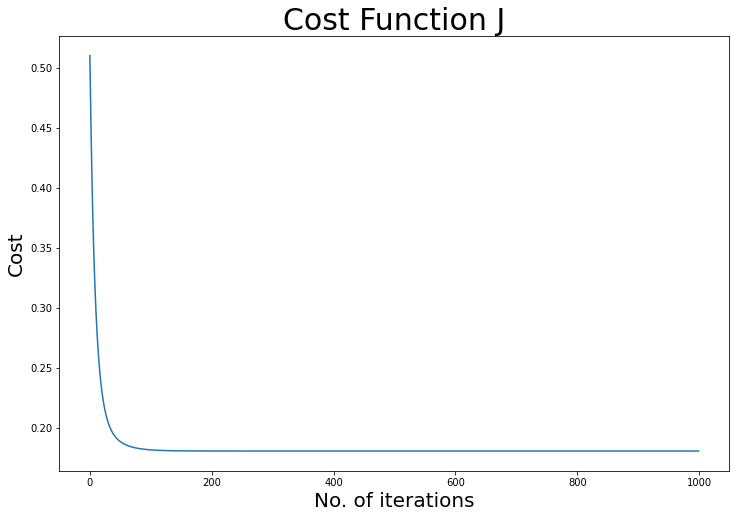

In [224]:
GD.plot_cost()

In [225]:
GD.R_squared(X)

0.41548415377934467

Result visualization


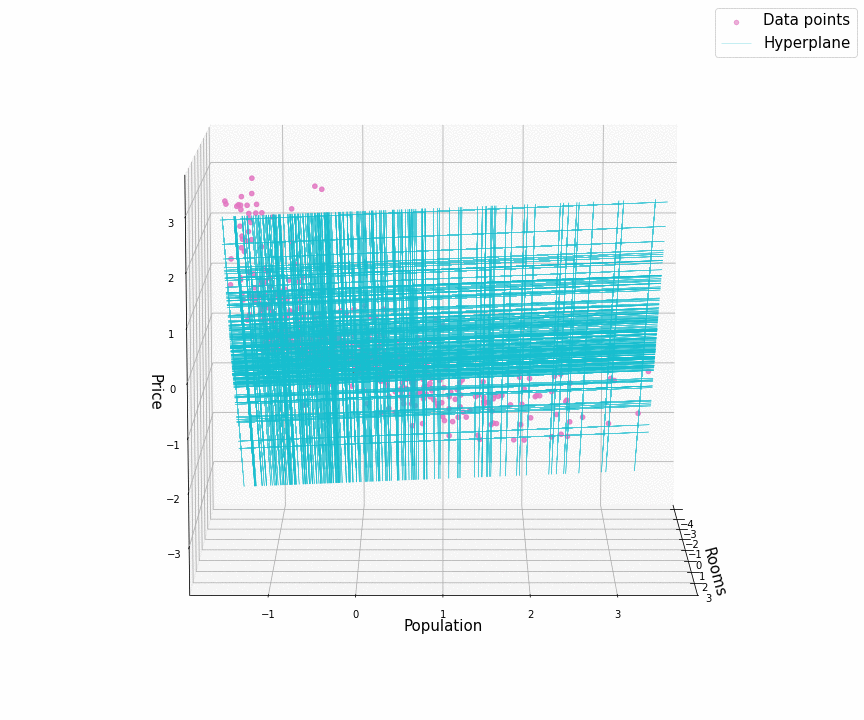

In [226]:
plot_3D(X, y, theta)

### Stochastic Gradient Descent

The algorithm basicaly implements the following:
$$ \overline{Q} = \frac{1}{m} (prediction - y)^{T}(prediction - y) $$

$$
\begin{align}
for\ j\ in\ (0, epoch\_count)\ \{ \\
    i = random\_int(1, m) \ \\\
    \epsilon_{i} = Loss_i(\theta)\ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \\
    \theta = \theta - \alpha * \nabla Loss_i(\theta) \ \  \\
    \overline{Q} = \lambda\epsilon_i + (1-\lambda)\overline{Q}\ \ \ \ \ \  \\
\}.\ \ \ \  \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ 
\end{align}
$$

In [227]:
class StochasticGradientDescent(GradientDescent):

    def __init__(self, learning_rate=0.01, forget_rate = 0.1, epoch_no = 10000):
        self.alpha = learning_rate
        self.epsilon = forget_rate
        self.theta = None
        self.epoch_count = epoch_no
        self.name = "Stochastic Gradient Descent"
        self.cost_list = None
        self.theta_list = None
        self.prediction_list = None

    def fit(self, X, y, no_of_samples=None):
        if no_of_samples is None:
            m = y.size
        else:
            m = no_of_samples

        self.cost_list = []   #to record all cost values to this list
        self.theta_list = []  #to record all theta_0 and theta_1 values to this list 

        self.theta = np.random.rand(3)
        error = np.dot(X, self.theta) - y #predicted_y = theta_0*x0+theta_1*x1
        cost = 1/(2*m) * np.dot(error.T, error)

        out = display(progress(0, 100), display_id=True)
        for j in range(self.epoch_count):
            i = np.random.randint(0, m)
            prediction_i = np.dot(X[i], self.theta)   #predicted y values theta_0*x0+theta_1*x1
            error_i = prediction_i - y[i]
            
            #cost = (1 - self.epsilon) * cost + self.epsilon * (error_i ** 2)  # Cost is MSE. (error_i)^2
            prediction = np.dot(X, self.theta)   #predicted y values theta_0*x0+theta_1*x1
            error = prediction - y
            cost = 1/(2*m) * np.dot(error.T, error) 
            
            self.cost_list.append(cost)
            self.theta -= (self.alpha * error_i * X[i])   # alpha * [error_i*x_i]
            self.theta_list.append(self.theta)
            out.update(progress(j, self.epoch_count))

        return self.cost_list, self.theta_list

In [228]:
alpha = 0.005
lmbd = 0.03
SGD = StochasticGradientDescent(learning_rate=alpha, forget_rate=lmbd, epoch_no=10000)
help(SGD)

Help on StochasticGradientDescent in module __main__ object:

class StochasticGradientDescent(GradientDescent)
 |  StochasticGradientDescent(learning_rate=0.01, forget_rate=0.1, epoch_no=10000)
 |  
 |  Method resolution order:
 |      StochasticGradientDescent
 |      GradientDescent
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, learning_rate=0.01, forget_rate=0.1, epoch_no=10000)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  fit(self, X, y, no_of_samples=None)
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from GradientDescent:
 |  
 |  MSE(self, X, y)
 |  
 |  R_squared(self, X)
 |  
 |  plot_cost(self)
 |  
 |  predict(self, X)
 |  
 |  show_thetas(self)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from GradientDescent:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  


In [229]:
sgd_cost_list, theta_list = SGD.fit(X, y)
theta = theta_list[-1]
theta

array([ 0.03487246,  0.30557389, -0.52322907])

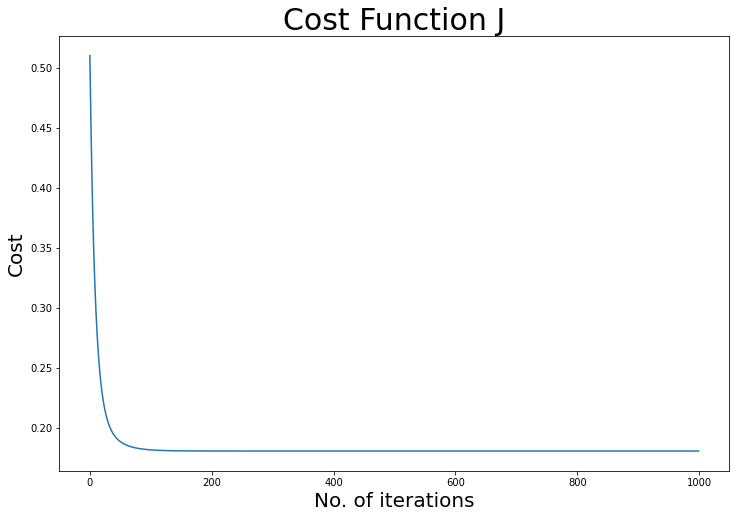

In [230]:
SGD.plot_cost()

In [231]:
SGD.R_squared(X)

0.6322630567587229

#### Result visualization


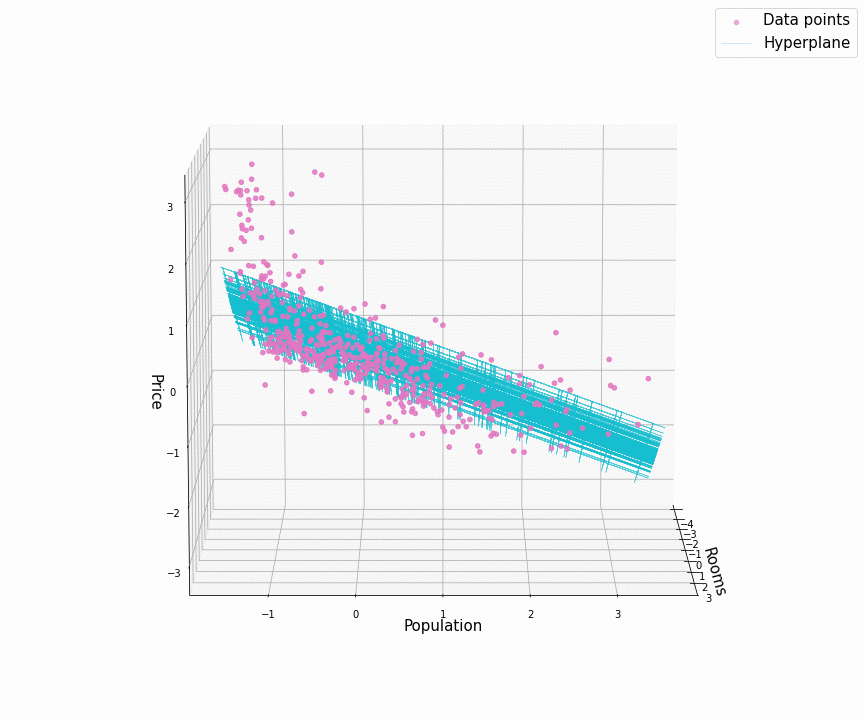

In [232]:
plot_3D(X, y, theta)

## Stochastic Average Gradient

The algorithm basicaly implements the following:
$$ 
G_i = \nabla Loss_i (\theta), \forall i\in[1, m] \\ 
G = \sum_{i=1}^{m} G_i \\
\overline{Q} = \frac{1}{m} (prediction - y)^{T}(prediction - y) 
$$

$$
\begin{align}
for\ i\ in\ (0, epoch\_count)\ \{ \\
    i = random\_int(1, m) \ \\\
    \epsilon_{i} = Loss_i(\theta)\ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \\
    G_i = \nabla Loss_i (\theta)\ \ \ \ \ \ \ \ \ \ \ \  \\
    \theta = \theta - \frac {\alpha} {l} \sum_{i=1}^{m} G_i \ \  \\
    \overline{Q} = \lambda\epsilon_i + (1-\lambda)\overline{Q}\ \ \ \ \ \  \\
\}.\ \ \ \  \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ 
\end{align}
$$

In [233]:
class StochasticAverageGradientDescent(GradientDescent):

    def __init__(self, learning_rate=0.01, forget_rate = 0.1, epoch_no = 10000):
        self.alpha = learning_rate
        self.epsilon = forget_rate
        self.theta = None
        self.epoch_count = epoch_no
        self.name = "Stochastic Average Gradient Descent"
        self.cost_list = None
        self.theta_list = None
        self.prediction_list = None

    def fit(self, X, y, no_of_samples=None):
        if no_of_samples is None:
            m = y.size
        else:
            m = no_of_samples

        self.cost_list = []   #to record all cost values to this list
        self.theta_list = []  #to record all theta_0 and theta_1 values to this list 

        self.theta = np.random.rand(3)

        prediction = np.dot(X, self.theta)   #predicted y values theta_0*x0+theta_1*x1
        error = prediction - y
        cost = 1/(2*m) * np.dot(error.T, error)   # Cost is MSE. (1/2m)*sum[(error)^2]
        self.cost_list.append(cost)
        #print(X.shape, y.shape, error.shape)
        gradients = []
        gradient_sum = 0
        for i in range(m):
            gradients.append(2 * np.dot(X[i].T, error[i]))
            gradient_sum += gradients[i]
        cost = 1/(2*m) * np.dot(error.T, error)

        out = display(progress(0, 100), display_id=True)
        for j in range(self.epoch_count):
            i = np.random.randint(0, m)
            prediction_i = np.dot(X[i], self.theta)   #predicted y values theta_0*x0+theta_1*x1
            error_i = prediction_i - y[i]
            grad_i_new = 2 * np.dot(X[i].T, error[i])
            gradient_sum = gradient_sum - gradients[i] + grad_i_new
            gradients[i] = grad_i_new
            
            #cost = (1 - self.epsilon) * cost + self.epsilon * (error_i ** 2)  # Cost is MSE. (error_i)^2
            prediction = np.dot(X, self.theta)   #predicted y values theta_0*x0+theta_1*x1
            error = prediction - y
            cost = 1/(2*m) * np.dot(error.T, error) 

            self.cost_list.append(cost)
            self.theta -= (self.alpha / m) * gradient_sum  # alpha * [error_i*x_i]
            self.theta_list.append(self.theta)
            out.update(progress(j, self.epoch_count))

        return self.cost_list, self.theta_list

In [234]:
alpha = 0.001
lmbd = 0.3
SAG = StochasticAverageGradientDescent(learning_rate=alpha, forget_rate=lmbd, epoch_no=10000)
help(SAG)

Help on StochasticAverageGradientDescent in module __main__ object:

class StochasticAverageGradientDescent(GradientDescent)
 |  StochasticAverageGradientDescent(learning_rate=0.01, forget_rate=0.1, epoch_no=10000)
 |  
 |  Method resolution order:
 |      StochasticAverageGradientDescent
 |      GradientDescent
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, learning_rate=0.01, forget_rate=0.1, epoch_no=10000)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  fit(self, X, y, no_of_samples=None)
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from GradientDescent:
 |  
 |  MSE(self, X, y)
 |  
 |  R_squared(self, X)
 |  
 |  plot_cost(self)
 |  
 |  predict(self, X)
 |  
 |  show_thetas(self)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from GradientDescent:
 |  
 |  __dict__
 |      dictionary for instance 

In [235]:
sag_cost_list, theta_list = SAG.fit(X, y)
theta = theta_list[-1]
theta

array([-1.09696626e-05,  3.89223218e-01, -4.98821832e-01])

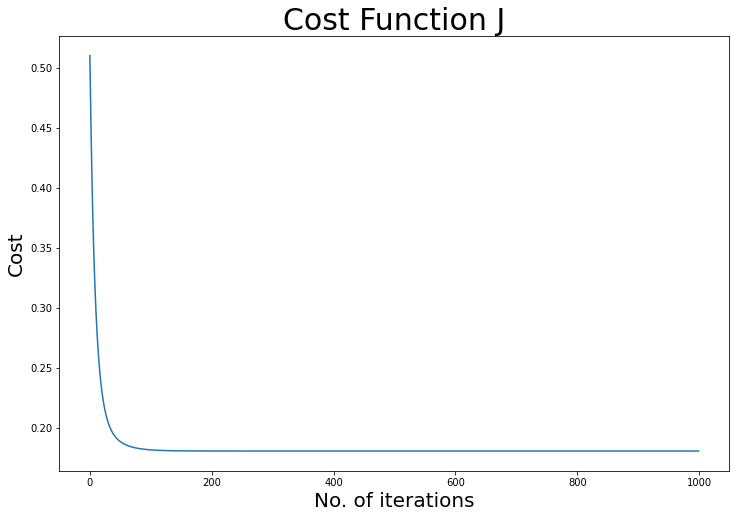

In [236]:
SAG.plot_cost()

In [237]:
SAG.R_squared(X)

0.6385616015664086

#### Data vizualization



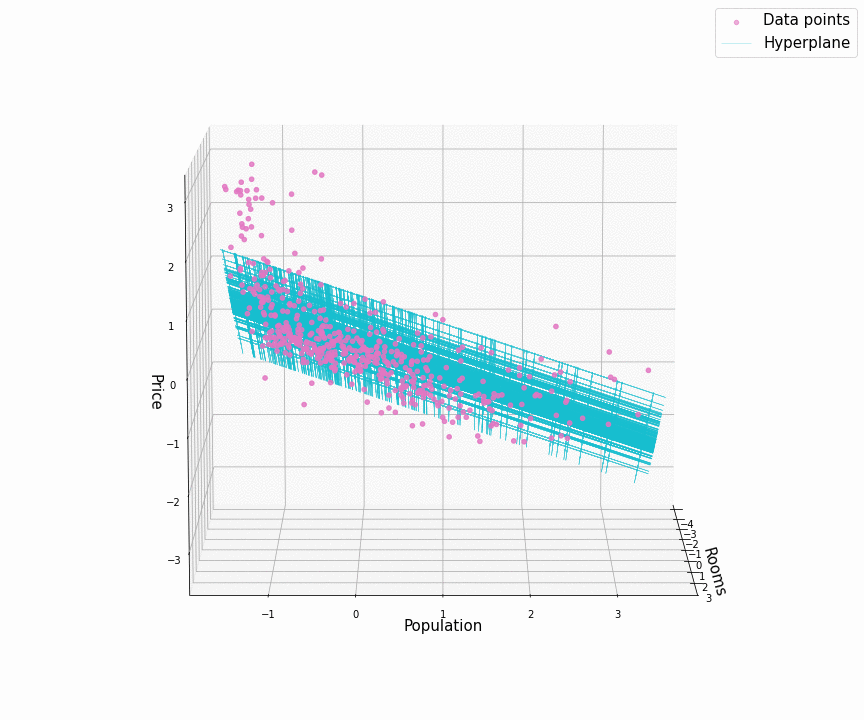

In [238]:
plot_3D(X, y, theta)

### Stochastic Variance Reduced Gradient Descent

In [239]:
class StochasticVarianceReducedGradient(GradientDescent):

    def __init__(self, learning_rate=0.01, forget_rate = 0.1, epoch_no = 10000, step = 50):
        self.alpha = learning_rate
        self.epsilon = forget_rate
        self.theta = None
        self.step = step
        self.epoch_count = epoch_no
        self.name = "Stochastic Gradient Descent"
        self.cost_list = None
        self.theta_list = None
        self.prediction_list = None

    def fit(self, X, y, no_of_samples=None):
        if no_of_samples is None:
            m = y.size
        else:
            m = no_of_samples

        self.cost_list = []  
        self.theta_list = []  

        theta_old = np.random.rand(3)
        error = np.dot(X, theta_old) - y 
        cost = 1/(2*m) * np.dot(error.T, error)

        out = display(progress(0, 100), display_id=True)
        for j in range(self.epoch_count):
            
            mu = (1/m)*np.dot(X.T,  np.dot(X,theta_old) - y)
            self.theta = theta_old 
            
            for t in range(0, self.step):
                i = np.random.randint(0, m)
                prediction_i = np.dot(X[i], self.theta)   
                error_i = prediction_i - y[i]
                prediction_i_old = np.dot(X[i], theta_old)   
                error_i_old = prediction_i_old - y[i]
                self.theta -= self.alpha * (error_i * X[i]  - error_i_old * X[i] + mu)   # alpha * [error_i*x_i]
                #print(self.theta)

            theta_old = self.theta

            prediction = np.dot(X, self.theta)   
            error = prediction - y
            cost = 1/(2*m) * np.dot(error.T, error) 
            self.cost_list.append(cost)
            self.theta_list.append(self.theta)
            out.update(progress(j, self.epoch_count))

        return self.cost_list, self.theta_list

In [240]:
alpha = 0.001
lmbd = 0.3
SVRG = StochasticVarianceReducedGradient(learning_rate=alpha, forget_rate=lmbd, epoch_no=1000, step = 50)
help(SVRG)

Help on StochasticVarianceReducedGradient in module __main__ object:

class StochasticVarianceReducedGradient(GradientDescent)
 |  StochasticVarianceReducedGradient(learning_rate=0.01, forget_rate=0.1, epoch_no=10000, step=50)
 |  
 |  Method resolution order:
 |      StochasticVarianceReducedGradient
 |      GradientDescent
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, learning_rate=0.01, forget_rate=0.1, epoch_no=10000, step=50)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  fit(self, X, y, no_of_samples=None)
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from GradientDescent:
 |  
 |  MSE(self, X, y)
 |  
 |  R_squared(self, X)
 |  
 |  plot_cost(self)
 |  
 |  predict(self, X)
 |  
 |  show_thetas(self)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from GradientDescent:
 |  
 |  __dict__
 |      di

In [241]:
svrg_cost_list, theta_list = SVRG.fit(X, y)
theta = theta_list[-1]
theta

array([-6.52205104e-16,  3.89218754e-01, -4.98757035e-01])

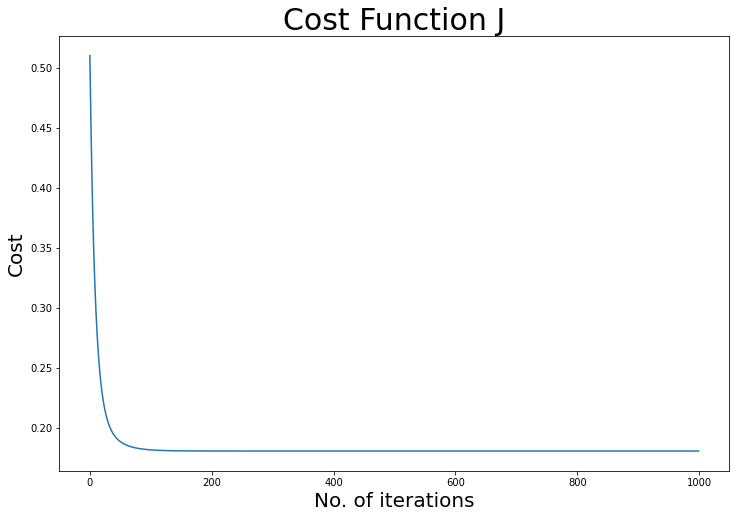

In [242]:
SVRG.plot_cost()

In [243]:
SVRG.R_squared(X)

0.63856160626034


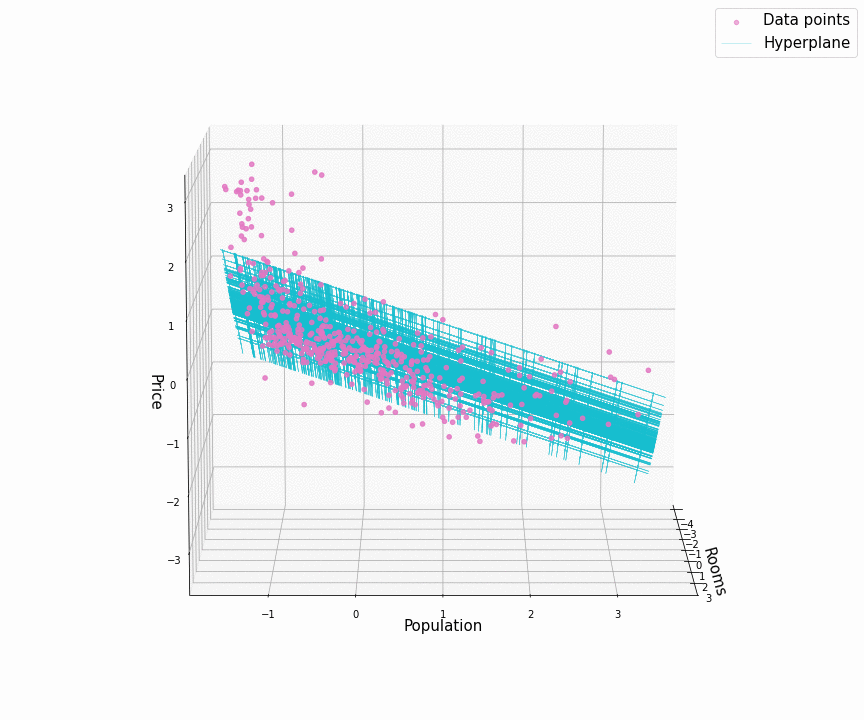

In [244]:
plot_3D(X, y, theta)

In [246]:
def visualize_learning_results(history, labels = None, add_funcs = [], add_func_labels = [], start = None, end = None, title = None):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    n = len(history)
    X = np.arange(n)
    labels = list(labels)
    add_func_labels = list(add_func_labels)
    for i, Y in enumerate(history):
        X = np.arange(len(Y))
        if labels:
            ax.plot(X, Y, label=labels[i])
        else:
            ax.plot(X, Y)
    for i, f in enumerate(add_funcs):
        X = np.arange(n)
        if callable(f):
            Y = f(X)
            if add_func_labels:
                ax.plot(X, Y, label=add_func_labels[i])
            else:
                ax.plot(X, Y)
        else:
            ax.axhline(y=f, label=add_func_labels[i], color='r')
    plt.legend()
    if title:
        plt.title(title)
    plt.show()


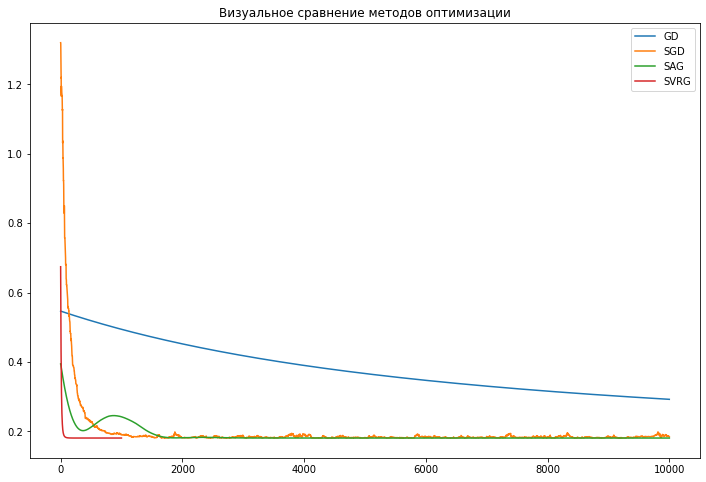

In [248]:
visualize_learning_results(
    [gd_cost_list,sgd_cost_list,sag_cost_list,svrg_cost_list], labels=["GD", "SGD", "SAG", "SVRG"],
    title = "Визуальное сравнение методов оптимизации")